Reanalysis of [No evidence that more physically attractive women have higher estradiol or progesterone](https://www.biorxiv.org/content/early/2017/09/14/136515).  
Data and R code see https://osf.io/qd9bv

## Environment setups

In [1]:
import os

import numpy as np
import pandas as pd
import seaborn as sns
import pymc3 as pm
import theano.tensor as tt

%pylab inline
%config InlineBackend.figure_format = 'retina'
%load_ext watermark

plt.style.use('ggplot')

Populating the interactive namespace from numpy and matplotlib


In [2]:
%watermark -v -m -p numpy,pandas,seaborn,pymc3,matplotlib

CPython 3.5.2
IPython 6.2.1

numpy 1.13.3
pandas 0.21.0
seaborn 0.8.1
pymc3 3.2
matplotlib 2.1.0+224.g95805d2

compiler   : GCC 5.4.0 20160609
system     : Linux
release    : 4.4.0-103-generic
machine    : x86_64
processor  : x86_64
CPU cores  : 8
interpreter: 64bit


## Load data, display descriptive result

In [3]:
tbl0 = pd.read_csv('ratings_anon.csv')
tbl0.head()

,rater_id,rater_sex,rater_age,face_id,session,rating,progesterone,estradiol,whr
0,R_5771d6b1,female,22.3,F_2612eef7,1,3,92.079,4.0113,0.74615
1,R_5771d6b1,female,22.3,F_2612eef7,2,4,115.440,3.9282,0.74615
2,R_5771d6b1,female,22.3,F_2612eef7,3,3,141.520,4.7279,0.74615
3,R_5771d6b1,female,22.3,F_2612eef7,4,3,163.950,3.9507,0.74615
4,R_5771d6b1,female,22.3,F_2612eef7,5,3,94.475,3.4927,0.74615


In [4]:
measure_label = ['progesterone', 'estradiol', 'rating', 'whr']
Nmeasure = len(measure_label)

(tbl0.groupby(['face_id'])[measure_label]
 .agg(['mean', 'std'])).round(3)

progesterone          estradiol        rating           whr     
                   mean      std      mean    std   mean    std   mean  std
face_id                                                                    
F_005e9ab6      193.834   61.126     3.817  0.726  3.343  1.361  0.730  0.0
F_019a25ce      153.371  123.950     2.206  1.127  3.479  1.505  0.690  0.0
F_02515a81      287.325  165.070     4.132  0.455  3.371  1.495  0.725  0.0
F_026dcba8      256.638   98.034     5.921  0.436  3.350  1.393  0.795  0.0
F_068a62f3      118.176   50.799     3.583  0.227  2.157  1.095  0.910  0.0
F_07f6d841      398.330  153.063     3.214  0.599  2.936  1.219  0.724  0.0
F_0a5e7fd8      150.741   58.639     3.003  0.426  2.814  1.185  0.778  0.0
F_0d755762      177.526   86.829     3.700  1.067  2.379  0.978  0.864  0.0
F_0d96e576      197.102   40.797     5.504  0.659  2.429  1.060  0.728  0.0
F_0e7c8c77      112.900   71.270     3.659  0.434  2.650  1.092  0.723  0.0
F_0fdfc948       81.823   14.193     3.318  0.420  2.236  0.949  0.863  0.0
F_0ffa534d      254.510  138.910     4.018  0.626  3.236  1.515  0.677  0.0
F_1084d6d8       55.348   31.388     1.489  0.830  3.993  1.496  0.672  0.0
F_116cfce6      132.525   49.340     4.756  0.484  2.900  1.265  0.752  0.0
F_125024f2      154.900  107.575     3.481  0.449  2.821  1.183  0.684  0.0
F_1252c088      191.994   20.500     4.245  0.288  2.686  1.200  0.853  0.0
F_151a906c      154.721   39.951     3.404  0.389  2.450  1.013  0.739  0.0
F_15d9f475       81.328   38.604     1.680  0.237  4.386  1.534  0.690  0.0
F_17a5a325      147.373   91.601     3.121  1.294  4.243  1.408  0.774  0.0
F_1ab1f111      128.278   70.343     3.919  1.418  4.757  1.468  0.749  0.0
F_1c413e80      111.583   38.072     4.176  0.597  4.257  1.552  0.753  0.0
F_1cbe36c6      100.981   33.048     2.453  0.458  2.450  1.201  0.730  0.0
F_1e4061dc       97.603   33.039     4.351  0.788  2.300  1.064  0.881  0.0
F_1eed1e04      125.297   75.286     3.533  0.773  2.907  1.346  0.732  0.0
F_2055fbd0       60.492   63.037     1.625  0.354  3.293  1.401  0.768  0.0
F_205c8ff0       65.477   45.282     2.640  1.006  2.686  1.230  0.778  0.0
F_206bad54      182.676  110.376     2.187  0.625  2.736  1.191  0.675  0.0
F_21db5c0f      115.969  111.557     2.574  0.659  4.807  1.522  0.677  0.0
F_21fa23c8      155.101   54.770     3.952  0.355  3.514  1.238  0.742  0.0
F_245bc574      176.328   44.669     3.925  0.876  2.393  1.037  0.680  0.0
...                 ...      ...       ...    ...    ...    ...    ...  ...
F_e02c10b4      187.186  101.634     4.265  0.677  3.786  1.245  0.679  0.0
F_e0a24c0d       46.197   31.549     2.251  0.576  2.757  1.085  0.825  0.0
F_e1ed9aeb      367.508  168.282     4.256  0.543  3.057  1.458  0.777  0.0
F_e298a0ec      111.837   44.953     4.242  0.758  1.914  0.894  0.732  0.0
F_e2a1924a      179.918   76.890     4.548  0.488  2.479  1.076  0.747  0.0
F_e38dd0c9      101.775   36.480     4.055  0.889  3.479  1.391  0.835  0.0
F_e68b34df       98.424   80.723     2.406  0.861  4.336  1.360  0.779  0.0
F_e8afc8c6       30.939    9.074     4.363  0.555  1.864  0.998  0.798  0.0
F_e9699b0d      111.658    9.865     3.922  0.460  2.657  1.168  0.784  0.0
F_e980f0e1      235.596   81.057     3.369  0.260  3.286  1.189  0.644  0.0
F_e9899467      235.824  137.035     1.953  0.231  2.564  1.040  0.722  0.0
F_ea038c56      198.210   93.102     3.164  0.503  2.964  1.214  0.771  0.0
F_ead5f790      160.687  129.313     2.036  0.412  3.429  1.282  0.739  0.0
F_ebb0f232      113.086   76.353     1.819  0.513  2.343  1.009  0.693  0.0
F_ebf40cb2      193.294   52.175     5.032  0.753  3.779  1.601  0.789  0.0
F_ece57e42      176.286   65.684     3.901  1.234  4.229  1.196  0.728  0.0
F_edd38ce6       72.473   27.975     3.148  0.406  3.564  1.400  0.745  0.0
F_eebba438      121.319   37.822     2.551  0.549  2.479  1.178  0.735  0.0
F_ef7d0a89      398.146  271.685     6.557  0.990  3.414  1

/usr/local/lib/python3.5/dist-packages/pandas/core/groupby.py:847: RuntimeWarning: Mean of empty slice
  f = lambda x: func(x, *args, **kwargs)


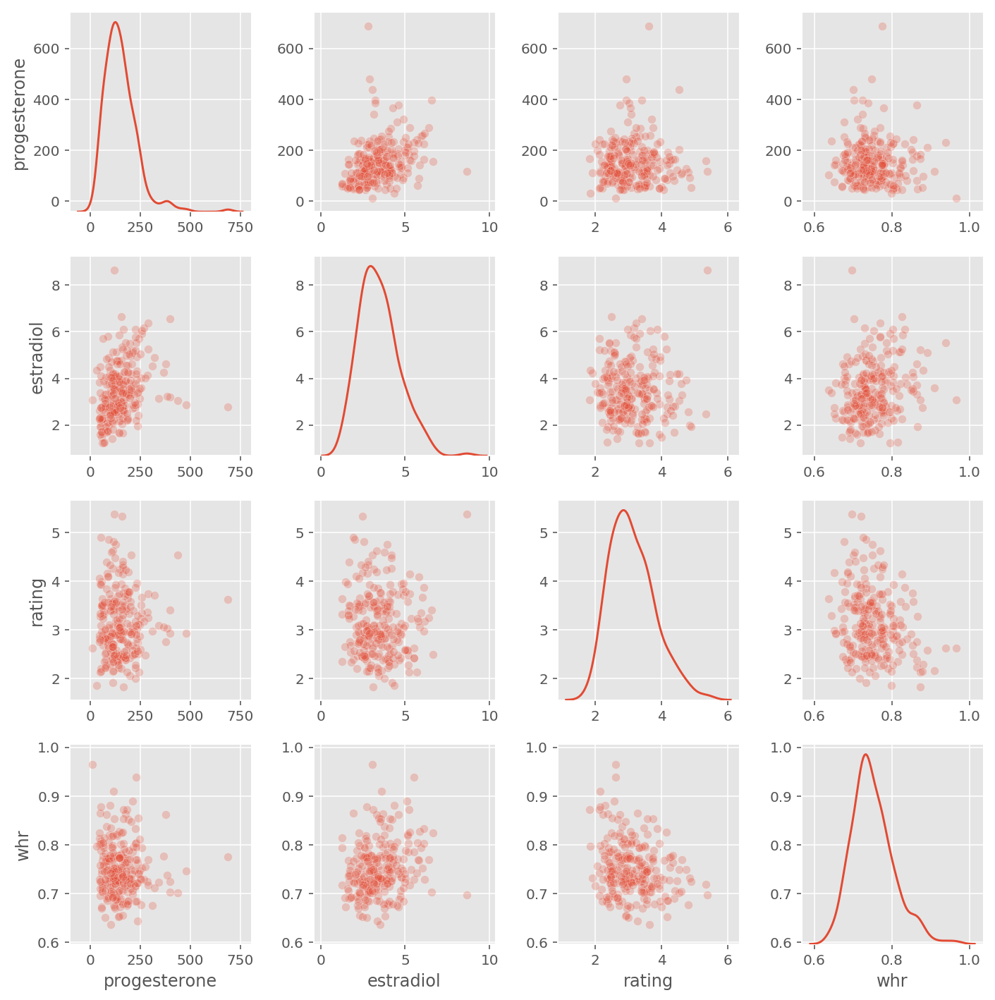

In [5]:
dfmean = (tbl0.groupby(['face_id'])[measure_label]
 .agg(np.nanmean))

sns.pairplot(dfmean[np.isfinite(dfmean.values.mean(axis=1))], diag_kind='kde', plot_kws=dict(alpha=.25));

/usr/local/lib/python3.5/dist-packages/pandas/core/groupby.py:847: RuntimeWarning: Mean of empty slice
  f = lambda x: func(x, *args, **kwargs)


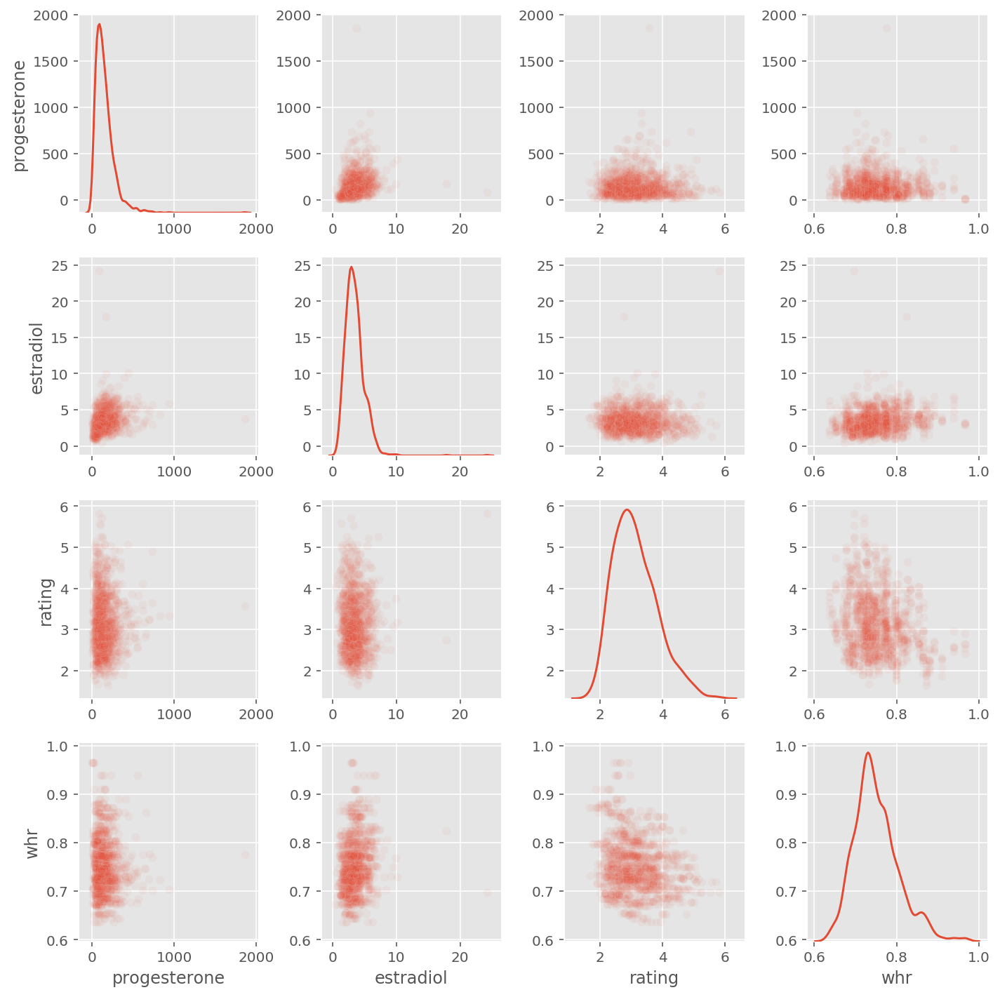

In [6]:
dfmean1 = (tbl0.groupby(['face_id', 'session'])[measure_label]
 .agg(np.nanmean))

sns.pairplot(dfmean1[np.isfinite(dfmean1.values.mean(axis=1))], diag_kind='kde', plot_kws=dict(alpha=.05));

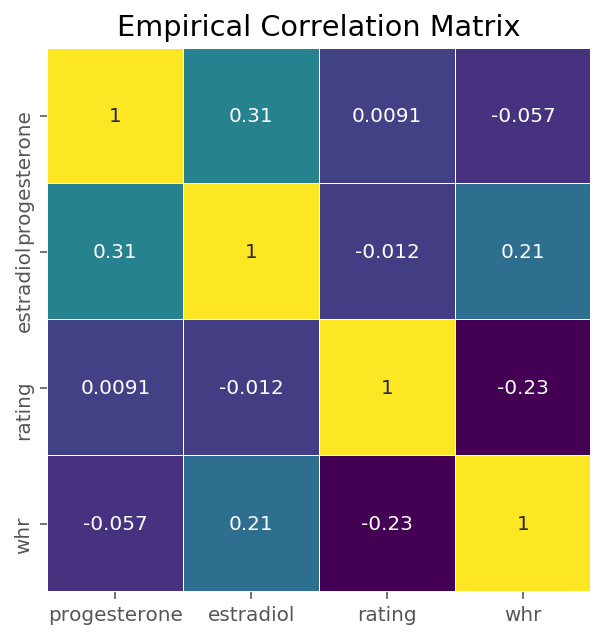

In [7]:
_, ax = plt.subplots(1, 1, figsize=(5, 5))

dataval = dfmean.values
for i in range(dataval.shape[1]):
    dataval[~np.isfinite(dataval[:, i]), i] = np.nanmean(dataval[:, i])

empirical_corr = pd.DataFrame(np.corrcoef(dataval.T),
                              columns=measure_label,
                              index=measure_label)
sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax)
ax.set_title('Empirical Correlation Matrix');

## Base line model on the subject average

In [8]:
with pm.Model() as model_mean:
    # on the assumption that attractiveness, progesterone and estradiol 
    # are correlated, this correlation could be capture with a cov matrix
    sd_dist = pm.HalfCauchy.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the correlation deviations etc
    sd = tt.sqrt(tt.diag(cov))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    # likelihood
    mu = pm.Normal('mu', mu=dataval.mean(axis=0), sd=10., shape=Nmeasure)
    obs = pm.MvNormal('obs', mu=mu, chol=chol, observed=dataval)
    
    # samples
    trace = pm.sample(1000, tune=2000, njobs=4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [mu, chol_cov_cholesky_cov_packed__]
  5%|▌         | 163/3000 [00:06<01:58, 24.00it/s]INFO (theano.gof.compilelock): Waiting for existing lock by process '5513' (I am process '5514')
INFO (theano.gof.compilelock): To manually release the lock, delete /home/laoj/.theano/compiledir_Linux-4.4--generic-x86_64-with-Ubuntu-16.04-xenial-x86_64-3.5.2-64/lock_dir
INFO (theano.gof.compilelock): Waiting for existing lock by process '5513' (I am process '5515')
INFO (theano.gof.compilelock): To manually release the lock, delete /home/laoj/.theano/compiledir_Linux-4.4--generic-x86_64-with-Ubuntu-16.04-xenial-x86_64-3.5.2-64/lock_dir
 64%|██████▎   | 1909/3000 [00:16<00:09, 118.20it/s]INFO (theano.gof.compilelock): Waiting for existing lock by process '5514' (I am process '5515')
INFO (theano.gof.compilelock): To manually release the lock, delete /home/laoj/.theano/compiledir

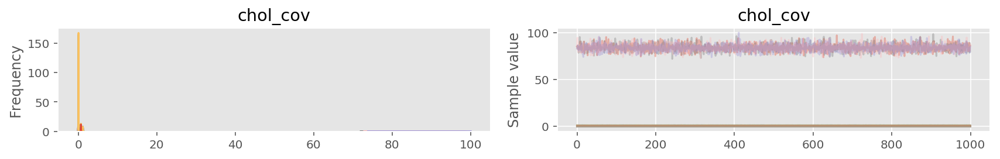

In [9]:
pm.traceplot(trace, varnames=['chol_cov']);

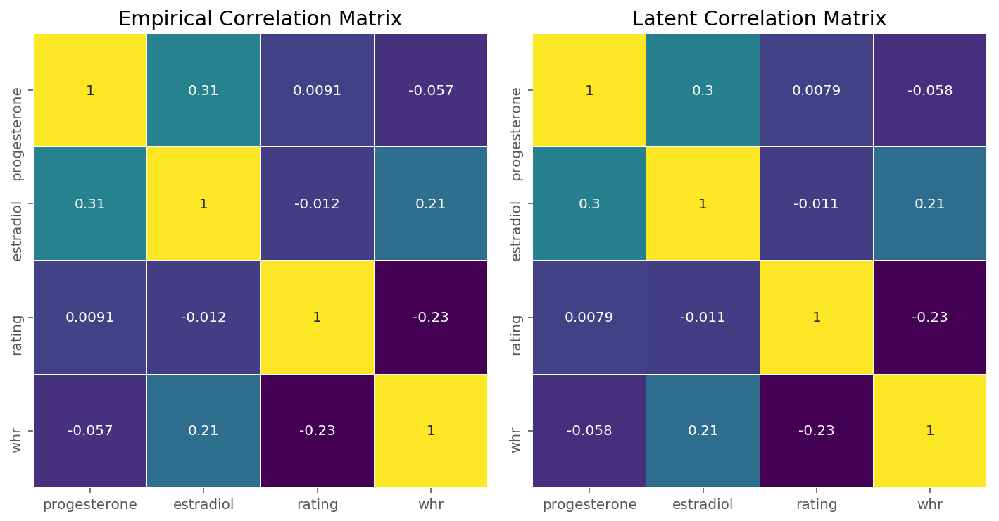

In [10]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace['corr'].mean(axis=0),
                             columns=measure_label,
                             index=measure_label)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

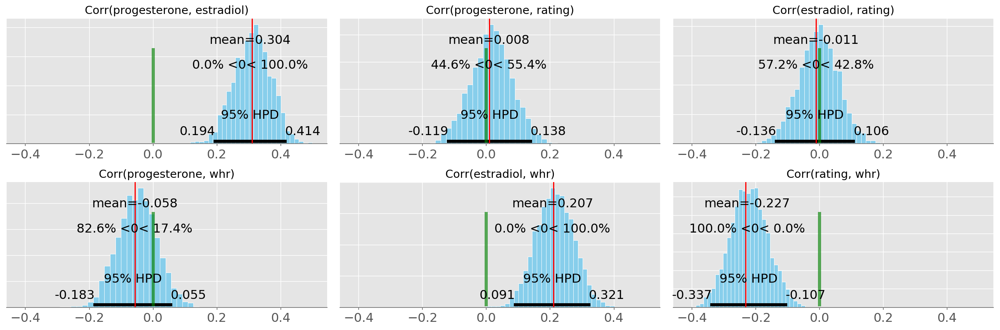

In [11]:
plotpost = pm.plots.artists.plot_posterior_op
idxall = np.tril_indices(4, k=-1)
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i in range(len(idxall[0])):
    iy, ix = idxall[0][i], idxall[1][i]
    trace_values = trace['corr'][:, ix, iy]
    plotpost(trace_values, ax1[i], kde_plot=False, point_estimate='mean', 
             round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
    
    ax1[i].axvline(empirical_corr.values[ix, iy], color='r')
    ax1[i].set_title('Corr('+measure_label[ix]+', '+measure_label[iy]+')')
plt.tight_layout();

## Full model on observed
Prepare data

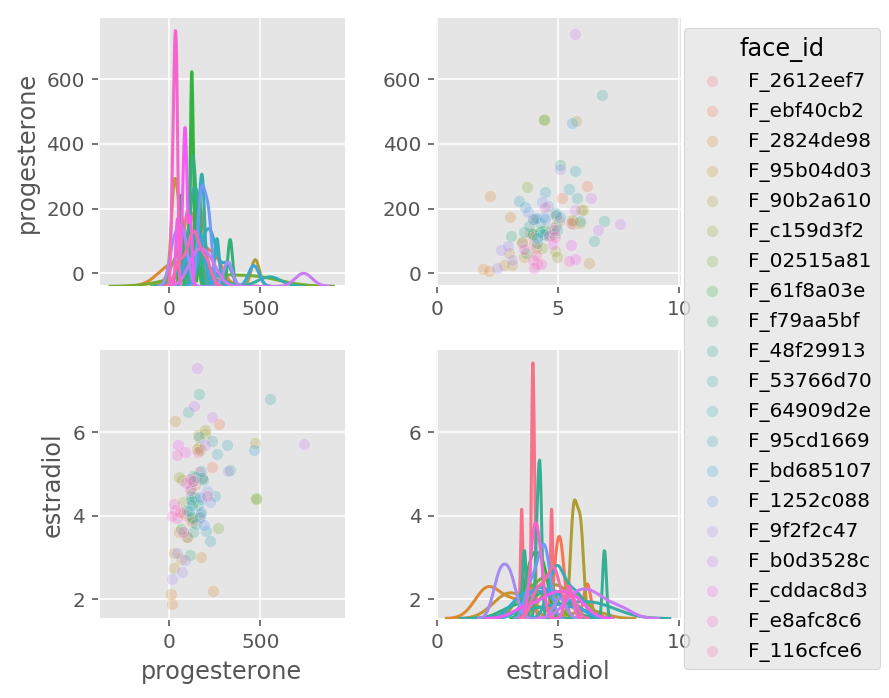

In [12]:
# test model on a subset of data
randsubj = tbl0['face_id'].unique()[:20]
tbl = (tbl0.loc[tbl0['face_id'].isin(randsubj).values, :]).reset_index()

tbl_ = tbl[['face_id', 'session', 'progesterone', 'estradiol']].drop_duplicates()

sns.pairplot(tbl_, hue='face_id', vars=['progesterone', 'estradiol'],
             diag_kind='kde', plot_kws=dict(alpha=.25));

In [13]:
tbl = tbl0

Data format (for 1 subject)

In [14]:
tbl[tbl['face_id']==tbl['face_id'][0]]

,rater_id,rater_sex,rater_age,face_id,session,rating,progesterone,estradiol,whr
0,R_5771d6b1,female,22.3,F_2612eef7,1,3,92.079,4.0113,0.74615
1,R_5771d6b1,female,22.3,F_2612eef7,2,4,115.440,3.9282,0.74615
2,R_5771d6b1,female,22.3,F_2612eef7,3,3,141.520,4.7279,0.74615
3,R_5771d6b1,female,22.3,F_2612eef7,4,3,163.950,3.9507,0.74615
4,R_5771d6b1,female,22.3,F_2612eef7,5,3,94.475,3.4927,0.74615
1245,R_75f0e81a,female,28.0,F_2612eef7,1,3,92.079,4.0113,0.74615
1246,R_75f0e81a,female,28.0,F_2612eef7,2,2,115.440,3.9282,0.74615
1247,R_75f0e81a,female,28.0,F_2612eef7,3,3,141.520,4.7279,0.74615
1248,R_75f0e81a,female,28.0,F_2612eef7,4,3,163.950,3.9507,0.74615
1249,R_75f0e81a,female,28.0,F_2612eef7,5,3,94.475,3.4927,0.74615


Set up latent variable (N participant * K measurment)

In [15]:
with pm.Model() as mvmodel:
    # on the assumption that attractiveness, progesterone and estradiol 
    # are correlated, this correlation could be capture with a cov matrix
    sd_dist = pm.HalfCauchy.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the correlation deviations etc
    sd = tt.sqrt(tt.diag(cov))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    # latent (zero mean Multivariate Normal)
    # latent = pm.MvNormal('latent', mu=np.zeros((Nmeasure,)), chol=chol, 
    #                      shape=dataval.shape, testval=dataval)
    
    # transform an uncorrelated normal:
    mu0 = pm.Normal('mu0', mu=0., sd=1., 
                    shape=dataval.shape)
    latent = tt.dot(chol, mu0.T).T

In [16]:
latent.tag.test_value.shape

(249, 4)

WHR measurement get the shortest (1 observeration per participant, with one missing).

In [17]:
subjID = np.asarray(tbl['face_id'].astype('category').cat.codes, dtype=np.int16)

# whr
whr_raw = np.asarray(tbl['whr'], dtype=np.float64)
sortID, index = np.unique(subjID, return_index=True)
whr_ = whr_raw[index]
index2 = np.isfinite(whr_)
whr = np.asarray(whr_[index2], dtype=np.float64)
whr_ID = sortID[index2]

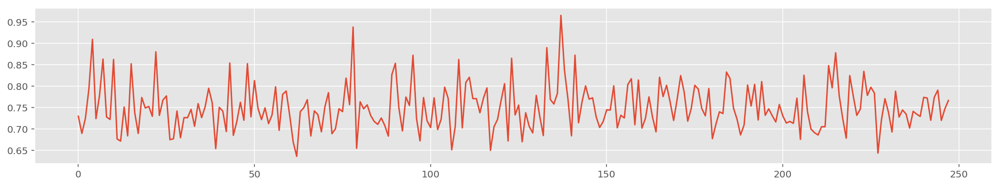

In [18]:
_, ax = plt.subplots(1, 1, figsize=(18, 3))
ax.plot(whr);

In [19]:
# whr
with mvmodel:
    whr_mu = pm.Normal('whr_mu', mu=whr.mean(), sd=1.)
    whr_obs = pm.Normal('whr_obs', mu=whr_mu+latent[whr_ID, 3], sd=.01, observed=whr)

Hormone measurment, each subject with 5 observations

In [20]:
# progesterone and estradiol
tbl2 = tbl[['face_id', 'session', 'progesterone', 'estradiol']].drop_duplicates()
progesterone = np.asarray(tbl2['progesterone'], dtype=np.float64)
estradiol = np.asarray(tbl2['estradiol'], dtype=np.float64)
subjID_hm = np.asarray(tbl2['face_id'].astype('category').cat.codes, dtype=np.int16)
sessID_hm = np.asarray(tbl2['session'].astype('category').cat.codes, dtype=np.int16)
# Nsess = 5
# sessID_hm = np.repeat(np.arange(Nsess)[None,], len(sortID), 0).flatten()

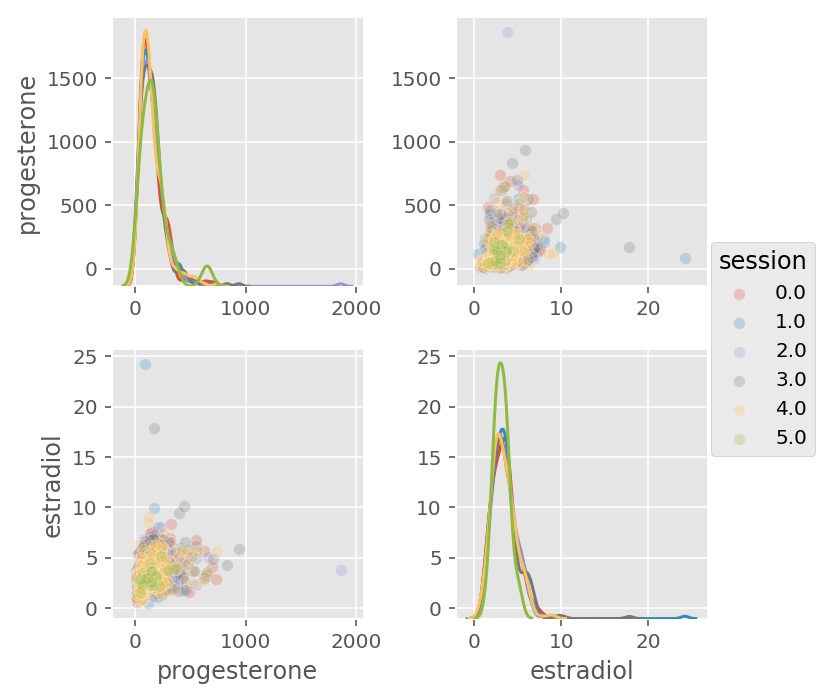

In [21]:
hormone_df = pd.DataFrame(np.vstack((sessID_hm, progesterone, estradiol)).T,
                          columns=['session', 'progesterone', 'estradiol'])
sns.pairplot(hormone_df, hue='session', vars=['progesterone', 'estradiol'],
             diag_kind='kde', plot_kws=dict(alpha=.25));

In [22]:
progest_mat = progesterone.reshape(len(np.unique(subjID_hm)), -1).T
estradi_mat = estradiol.reshape(len(np.unique(subjID_hm)), -1).T
horm_ID = subjID_hm.reshape(len(np.unique(subjID_hm)), -1).T[0]

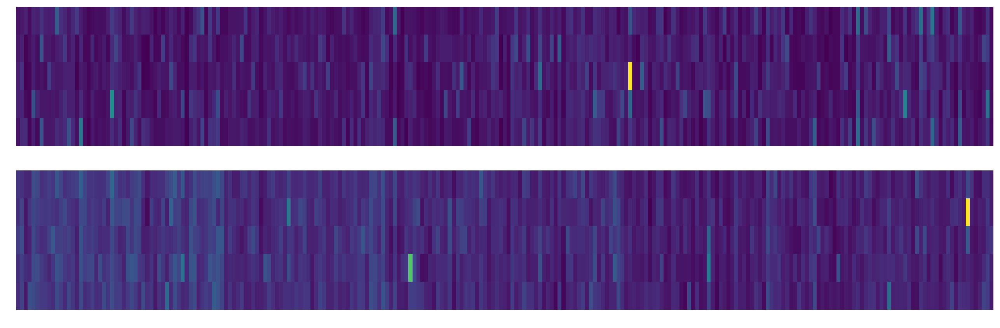

In [23]:
_, ax = plt.subplots(2, 1, figsize=(18, 6))
ax[0].imshow(progest_mat, cmap='viridis', aspect='auto')
ax[0].axis('off')
ax[1].imshow(estradi_mat, cmap='viridis', aspect='auto')
ax[1].axis('off')
plt.tight_layout();

Standard Deviation of hormone measurement


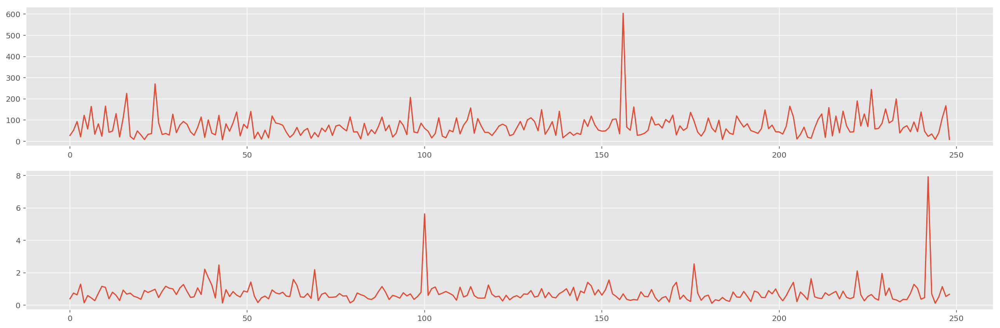

In [24]:
_, ax = plt.subplots(2, 1, figsize=(18, 6))
ax[0].plot(np.std(progest_mat, axis=0), label='progesterone')
ax[1].plot(np.std(estradi_mat, axis=0), label='estradiol')
plt.tight_layout();
print('Standard Deviation of hormone measurement')

In [25]:
# parameters for informative prior
hm1_emp_std = np.std(progest_mat, axis=0).mean()
hm2_emp_std = np.std(estradi_mat, axis=0).mean()

In [26]:
# progesterone and estradiol
with mvmodel:
    hm1_mu = pm.Normal('mu1', mu=progest_mat.mean(), sd=100.)
    hm1_std = pm.HalfCauchy('sd1', beta=5, shape=np.unique(subjID).shape, testval=hm1_emp_std)
    hm1_nu = pm.HalfNormal('nu1', 10.)
    hm1_obs = pm.StudentT('progest_obs', 
                          mu=latent[horm_ID, 0] + hm1_mu,
                          sd=hm1_std[horm_ID],
                          nu=hm1_nu,
                          observed=progest_mat)
    
    hm2_mu = pm.Normal('mu2', mu=estradi_mat.mean(), sd=10.)
    hm2_std = pm.HalfCauchy('sd2', beta=2, shape=np.unique(subjID).shape, testval=hm2_emp_std)
    hm2_nu = pm.HalfNormal('nu2', 10.)
    hm2_obs = pm.StudentT('estradi_obs', 
                          mu=latent[horm_ID, 1] + hm2_mu,
                          sd=hm2_std[horm_ID],
                          nu=hm2_nu,
                          observed=estradi_mat)

In [27]:
hm1_std.tag.test_value.shape

(249,)

In [28]:
hm1_obs.tag.test_value.shape

(5, 249)

Rating, the tallest data column

In [29]:
# ratings
Nrater = len(tbl['rater_id'].unique())
raterID = np.asarray(tbl['rater_id'].astype('category').cat.codes, dtype=np.int16)
raterSex = np.asarray(tbl['rater_sex'].astype('category').cat.codes, dtype=np.int16)
rating = np.asarray(tbl['rating'], dtype=np.float64)
# change rating to real line
rating_r = np.log(rating - 0) - np.log(8 - rating)

In [30]:
Nrating = len(np.unique(rating))
np.unique(rating)

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.])

In [31]:
with mvmodel:
    ratermu = pm.Normal('ratermu', mu=0., sd=1., shape=np.unique(raterID).shape)
    ratersd = pm.HalfNormal('ratersd', sd=10., shape=np.unique(raterID).shape)
    latentrate = latent[subjID, 2] + ratermu[raterID]
    rating_obs = pm.Normal('rating_obs', 
                           mu=latentrate,
                           sd=ratersd[raterID],
                           observed=rating_r)

In [32]:
with mvmodel:
    trace = pm.sample(2000, tune=1000, njobs=4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ratersd_log__, ratermu, nu2_log__, sd2_log__, mu2, nu1_log__, sd1_log__, mu1, whr_mu, mu0, chol_cov_cholesky_cov_packed__]
100%|██████████| 3000/3000 [45:59<00:00,  1.09it/s] 


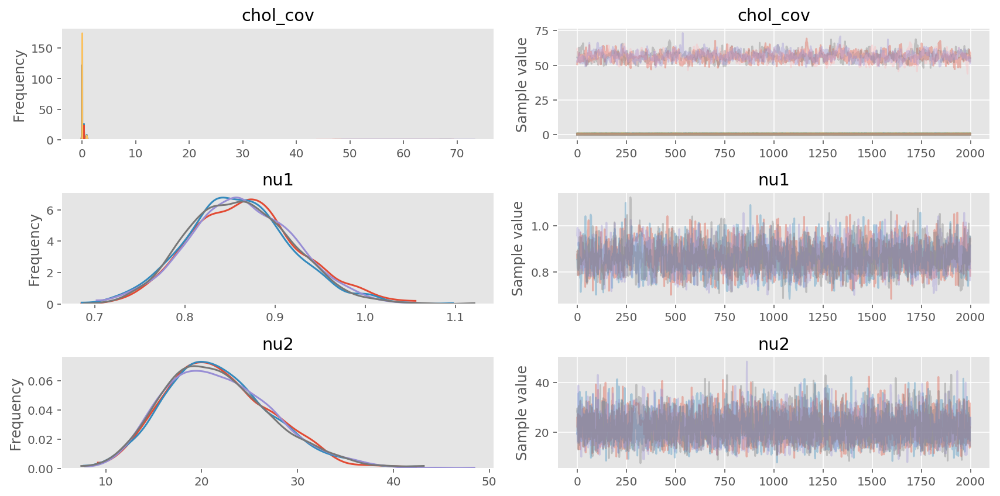

In [33]:
pm.traceplot(trace, varnames=['chol_cov', 'nu1', 'nu2']);

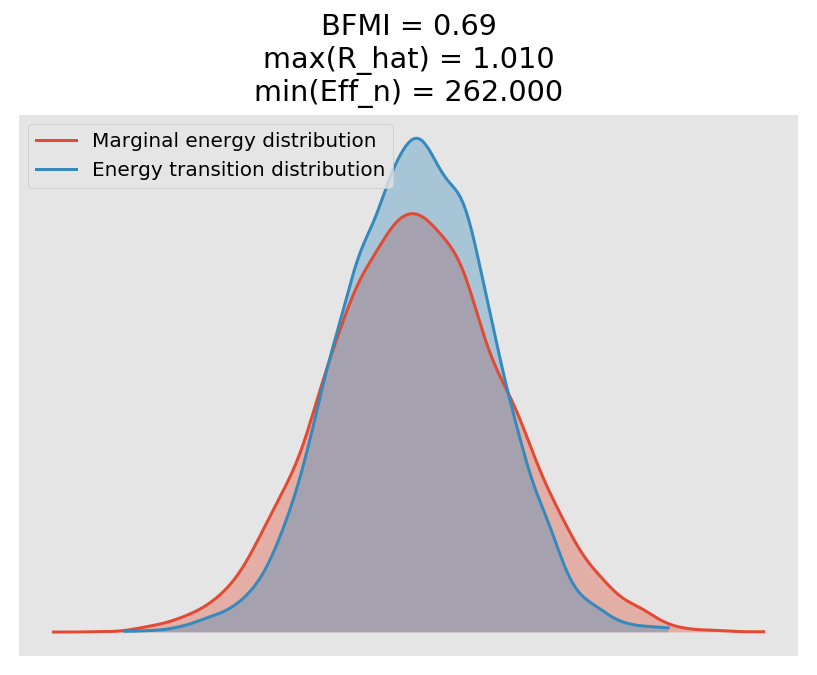

In [34]:
CONVERGENCE_TITLE = lambda: 'BFMI = {a:.2f}\nmax(R_hat) = {b:.3f}\nmin(Eff_n) = {c:.3f}'\
                    .format(a=bfmi, b=max_gr, c=min_effn)
def get_diags(trace):
    bfmi = pm.bfmi(trace)
    max_gr = max(np.max(gr_stats) for gr_stats in pm.gelman_rubin(trace).values())
    min_effn = min(np.median(ef_stats) for ef_stats in pm.effective_n(trace).values())
    return bfmi, max_gr, min_effn

_, ax = plt.subplots(1, 1, figsize=(7, 5))
bfmi, max_gr, min_effn = get_diags(trace)
(pm.energyplot(trace, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

In [86]:
ppc = pm.sample_ppc(trace, 500, model=mvmodel)

100%|██████████| 500/500 [00:02<00:00, 177.72it/s]


In [87]:
ppc.keys()

dict_keys(['estradi_obs', 'progest_obs', 'whr_obs', 'rating_obs'])

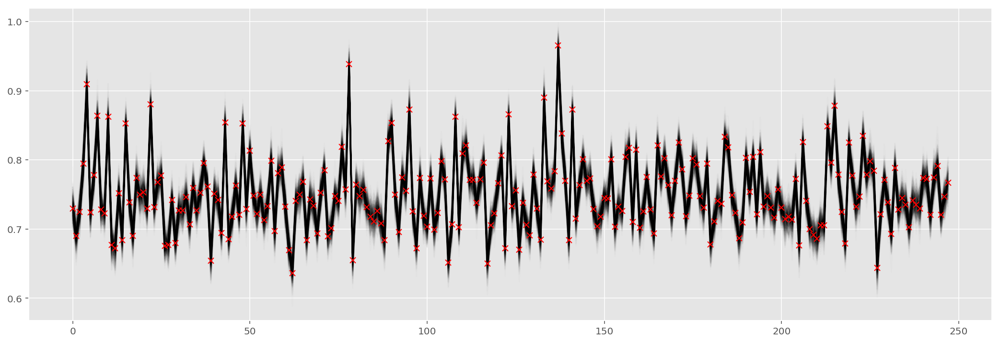

In [88]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['whr_obs'].T, 'k', alpha=.01);
ax.plot(whr, 'xr');

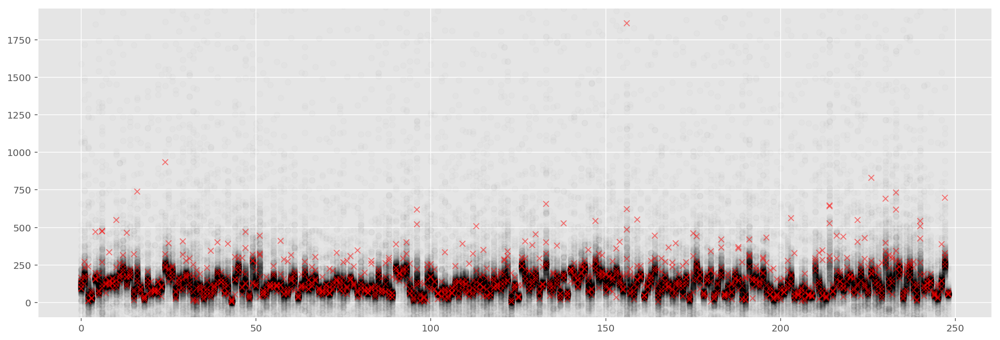

In [89]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['progest_obs'].T, 'ok', alpha=.01);
ax.plot(progest_mat.T, 'xr', alpha=.5);
ax.set_ylim(-100, np.max(progest_mat)+100);

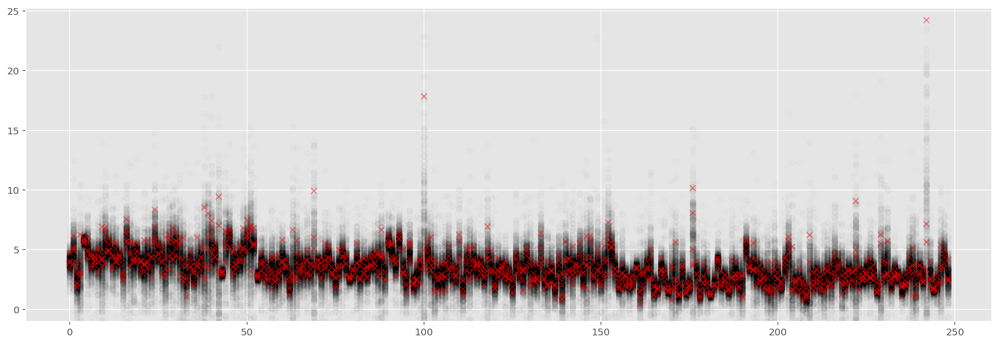

In [90]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['estradi_obs'].T, 'ok', alpha=.01);
ax.plot(estradi_mat.T, 'xr', alpha=.5);
ax.set_ylim(-1, np.max(estradi_mat)+1);

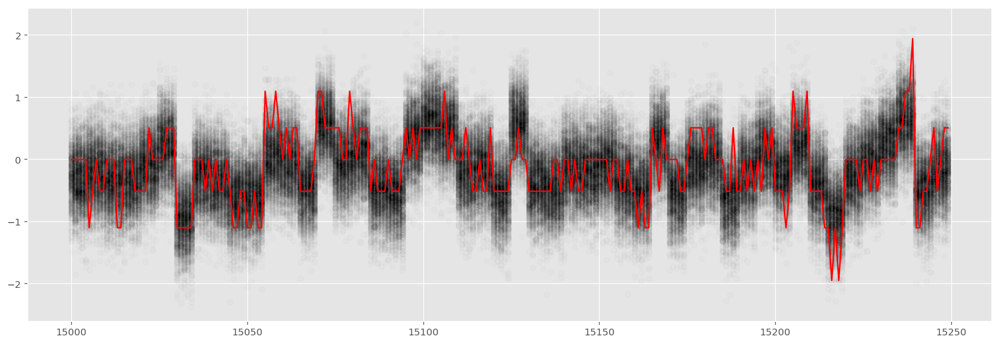

In [91]:
pltwidth = 250
idx = 15000 #np.random.randint(len(rating_r)-pltwidth)
pltrange = np.arange(idx, idx+pltwidth)
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(pltrange, ppc['rating_obs'].T[pltrange], 'ok', alpha=.01);
ax.plot(pltrange, rating_r.T[pltrange], 'r');

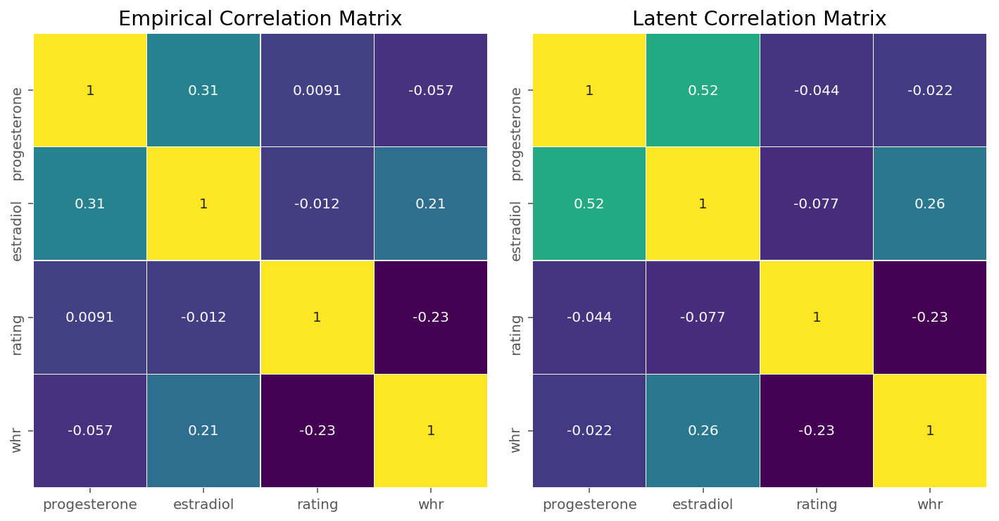

In [41]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace['corr'].mean(axis=0),
                             columns=measure_label,
                             index=measure_label)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

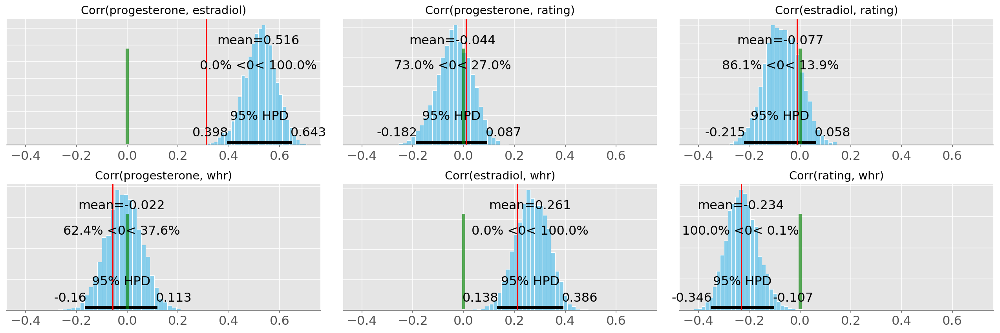

In [42]:
plotpost = pm.plots.artists.plot_posterior_op
idxall = np.tril_indices(4, k=-1)
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i in range(len(idxall[0])):
    iy, ix = idxall[0][i], idxall[1][i]
    trace_values = trace['corr'][:, ix, iy]
    plotpost(trace_values, ax1[i], kde_plot=False, point_estimate='mean', 
             round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
    
    ax1[i].axvline(empirical_corr.values[ix, iy], color='r')
    ax1[i].set_title('Corr('+measure_label[ix]+', '+measure_label[iy]+')')
plt.tight_layout();

# Alternative models

Using LogNormal to model the hormone measurements

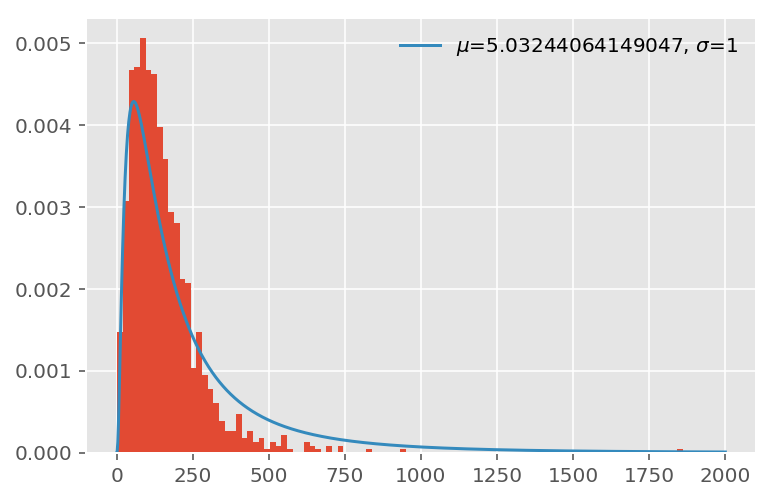

In [62]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as st
x = np.linspace(0.0, 2000.0, 1000)
fig, ax = plt.subplots()
ax.hist(progest_mat.flatten(), 100, normed=True)
f = lambda mu, sd : st.lognorm.pdf(x, sd, scale=np.exp(mu))
plot_pdf = lambda mu, sd : ax.plot(x, f(mu, sd), label=r'$\mu$={0}, $\sigma$={1}'.format(mu, sd))
plot_pdf(np.log(progest_mat.mean()), 1)
plt.legend(loc='upper right', frameon=False)
plt.show()

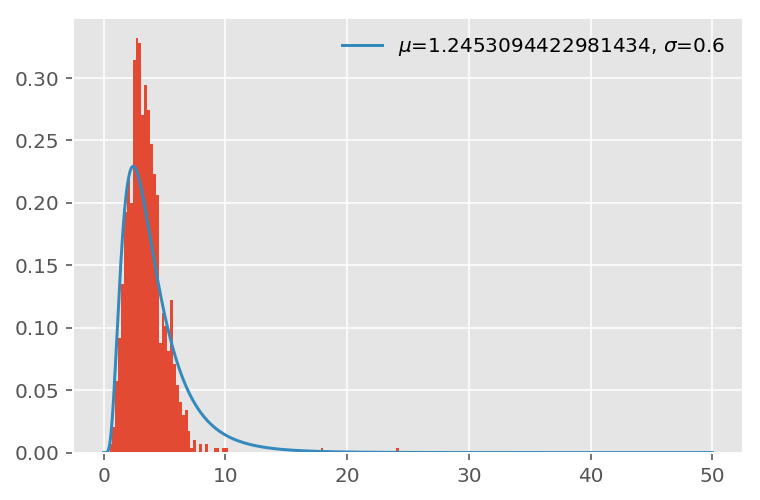

In [67]:
fig, ax = plt.subplots()
x = np.linspace(0.0, 50.0, 1000)
ax.hist(estradi_mat.flatten(), 100, normed=True)
f = lambda mu, sd : st.lognorm.pdf(x, sd, scale=np.exp(mu))
plot_pdf = lambda mu, sd : ax.plot(x, f(mu, sd), label=r'$\mu$={0}, $\sigma$={1}'.format(mu, sd))
plot_pdf(np.log(estradi_mat.mean()), .6)
plt.legend(loc='upper right', frameon=False)
plt.show()

In [68]:
with pm.Model() as mvmodel2:
    # on the assumption that attractiveness, progesterone and estradiol 
    # are correlated, this correlation could be capture with a cov matrix
    sd_dist = pm.HalfCauchy.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the correlation deviations etc
    sd = tt.sqrt(tt.diag(cov))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    # latent (zero mean Multivariate Normal)
    # latent = pm.MvNormal('latent', mu=np.zeros((Nmeasure,)), chol=chol, 
    #                      shape=dataval.shape, testval=dataval)
    
    # transform an uncorrelated normal:
    mu0 = pm.Normal('mu0', mu=0., sd=1., 
                    shape=dataval.shape)
    latent = tt.dot(chol, mu0.T).T
    
    # whr
    whr_mu = pm.Normal('whr_mu', mu=whr.mean(), sd=1.)
    whr_obs = pm.Normal('whr_obs', mu=whr_mu+latent[whr_ID, 3], sd=.01, observed=whr)
    
    # progesterone and estradiol
    hm1_mu = pm.Normal('mu1', mu=np.log(progest_mat.mean()), sd=10.)
    hm1_std = pm.HalfNormal('sd1', 1., shape=np.unique(subjID).shape, testval=hm1_emp_std)
    hm1_obs = pm.Lognormal('progest_obs', 
                          mu=tt.exp(latent[horm_ID, 0] + hm1_mu),
                          sd=hm1_std[horm_ID],
                          observed=progest_mat)
    
    hm2_mu = pm.Normal('mu2', mu=np.log(estradi_mat.mean()), sd=1.)
    hm2_std = pm.HalfNormal('sd2', .5, shape=np.unique(subjID).shape, testval=hm2_emp_std)
    hm2_obs = pm.Lognormal('estradi_obs', 
                          mu=tt.exp(latent[horm_ID, 1] + hm2_mu),
                          sd=hm2_std[horm_ID],
                          observed=estradi_mat)
    
    # ratings
    ratermu = pm.Normal('ratermu', mu=0., sd=1., shape=np.unique(raterID).shape)
    ratersd = pm.HalfNormal('ratersd', sd=10., shape=np.unique(raterID).shape)
    latentrate = latent[subjID, 2] + ratermu[raterID]
    rating_obs = pm.Normal('rating_obs', 
                           mu=latentrate,
                           sd=ratersd[raterID],
                           observed=rating_r)

In [69]:
with mvmodel2:
    trace2 = pm.sample(2000, tune=1000, njobs=4)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc3:Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
INFO:pymc3:Multiprocess sampling (4 chains in 4 jobs)
NUTS: [ratersd_log__, ratermu, sd2_log__, mu2, sd1_log__, mu1, whr_mu, mu0, chol_cov_cholesky_cov_packed__]
INFO:pymc3:NUTS: [ratersd_log__, ratermu, sd2_log__, mu2, sd1_log__, mu1, whr_mu, mu0, chol_cov_cholesky_cov_packed__]
 93%|█████████▎| 2788/3000 [22:26<01:42,  2.07it/s] /home/laoj/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:468: UserWarning: Chain 1 contains 57 diverging samples after tuning. If increasing `target_accept` does not help try to reparameterize.
  % (self._chain_id, n_diverging))
100%|██████████| 3000/3000 [23:34<00:00,  2.12it/s]/home/laoj/Documents/Github/pymc3/pymc3/step_methods/hmc/nuts.py:468: UserWarning: Chain 0 contains 91 diverging samples after tuning. If increasing `target_accep

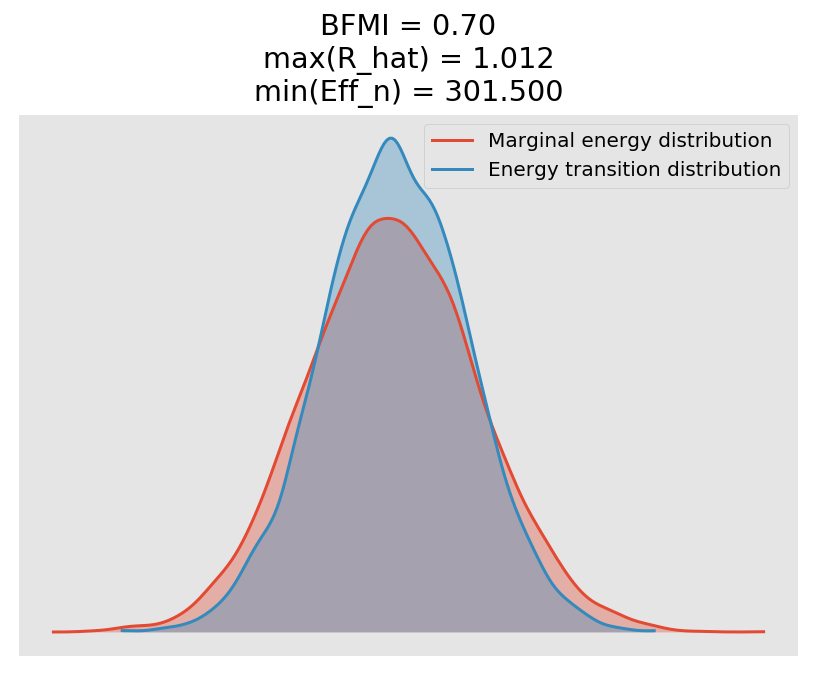

In [70]:
_, ax = plt.subplots(1, 1, figsize=(7, 5))
bfmi, max_gr, min_effn = get_diags(trace2)
(pm.energyplot(trace2, ax=ax)
   .set_title(CONVERGENCE_TITLE()));

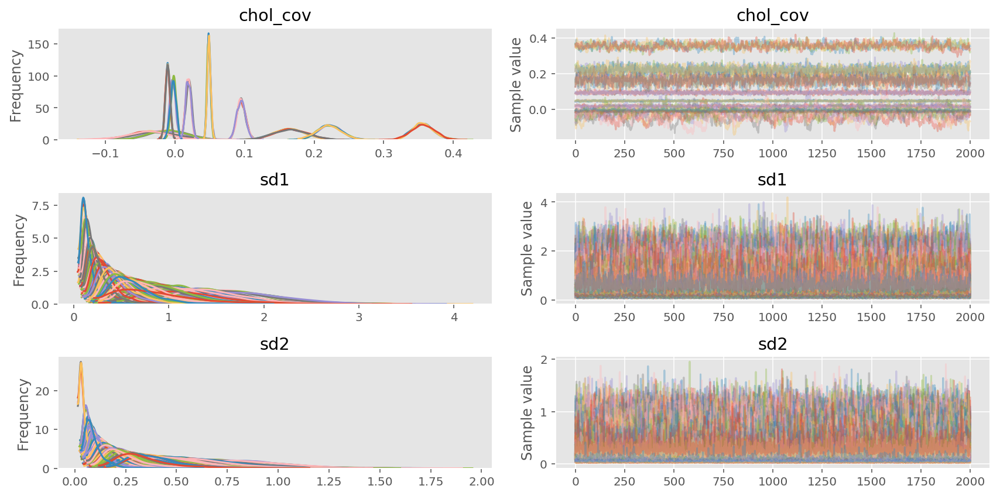

In [71]:
pm.traceplot(trace2, varnames=['chol_cov', 'sd1', 'sd2']);

In [73]:
import pickle

tracedump = dict(trace=trace, 
                 trace2=trace2)
with open('trace_temp.pickle', 'wb') as f:
    pickle.dump(tracedump, f)

# with open('trace_temp.pickle', 'rb') as f:
#     tracedump = pickle.load(f)
# trace1 = tracedump['trace']
# trace2 = tracedump['trace2']

In [76]:
# MODEL_NAME_MAP = {
#     0: "Student-T",
#     1: "LogNormal"
# }

# comp_df = (pm.compare([trace, trace2], 
#                       [mvmodel, mvmodel2],
#                       )
#              .rename(index=MODEL_NAME_MAP)
#              .loc[MODEL_NAME_MAP.values()])

# comp_df

In [77]:
ppc = pm.sample_ppc(trace2, 500, model=mvmodel2)

100%|██████████| 500/500 [00:11<00:00, 42.58it/s]


In [78]:
ppc.keys()

dict_keys(['estradi_obs', 'progest_obs', 'whr_obs', 'rating_obs'])

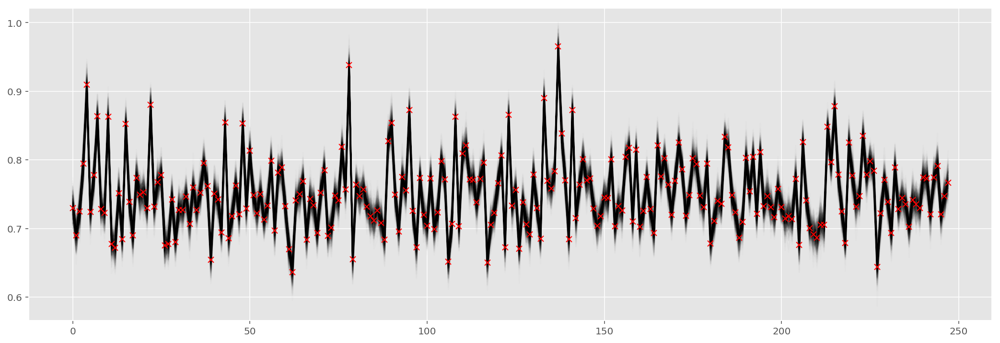

In [79]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['whr_obs'].T, 'k', alpha=.01);
ax.plot(whr, 'xr');

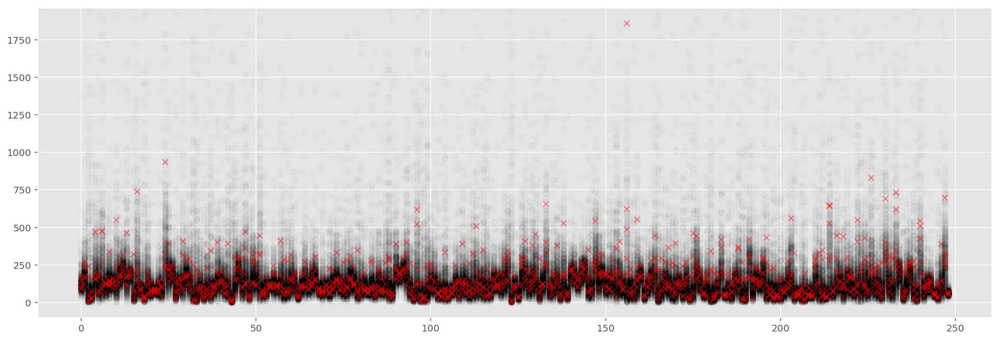

In [80]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['progest_obs'].T, 'ok', alpha=.01);
ax.plot(progest_mat.T, 'xr', alpha=.5);
ax.set_ylim(-100, np.max(progest_mat)+100);

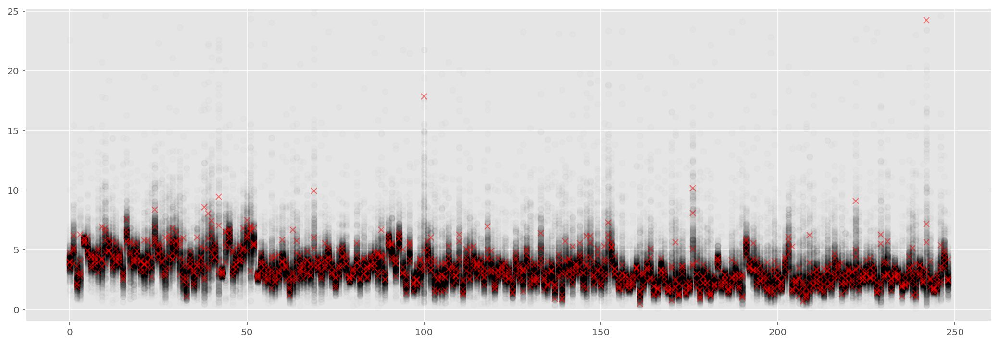

In [81]:
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(ppc['estradi_obs'].T, 'ok', alpha=.01);
ax.plot(estradi_mat.T, 'xr', alpha=.5);
ax.set_ylim(-1, np.max(estradi_mat)+1);

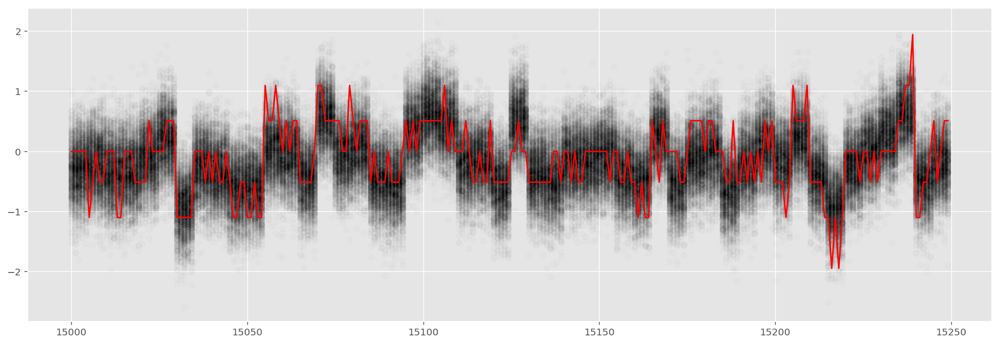

In [85]:
pltwidth = 250
idx = 15000 #np.random.randint(len(rating_r)-pltwidth)
pltrange = np.arange(idx, idx+pltwidth)
_, ax = plt.subplots(1, 1, figsize=(18, 6))
ax.plot(pltrange, ppc['rating_obs'].T[pltrange], 'ok', alpha=.01);
ax.plot(pltrange, rating_r.T[pltrange], 'r');

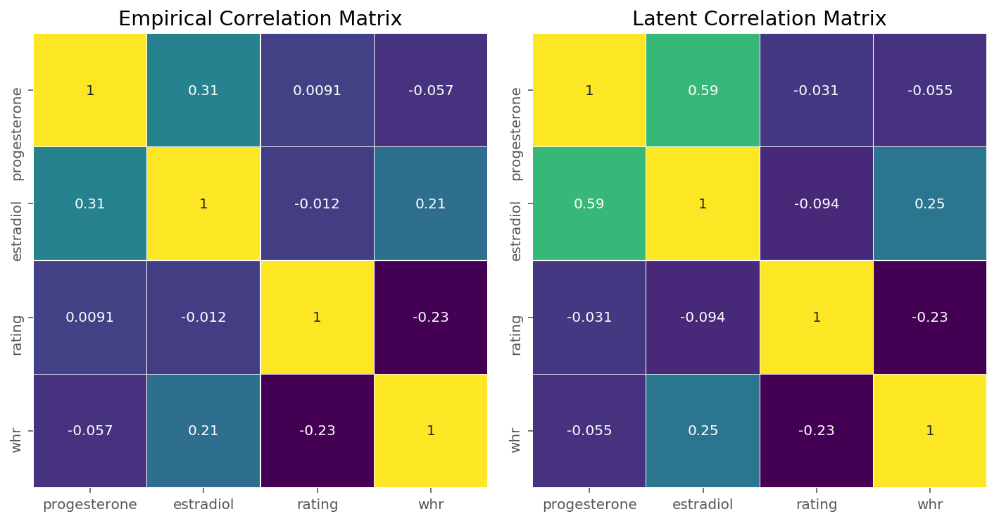

In [83]:
_, ax = plt.subplots(1, 2, figsize=(10, 5))

sns.heatmap(empirical_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[0])
ax[0].set_title('Empirical Correlation Matrix')

posterior_corr = pd.DataFrame(trace2['corr'].mean(axis=0),
                             columns=measure_label,
                             index=measure_label)
sns.heatmap(posterior_corr, 
            cbar=False, square = True, annot=True, 
            linewidths=.1, cmap='viridis', ax=ax[1])
ax[1].set_title('Latent Correlation Matrix')

plt.tight_layout();

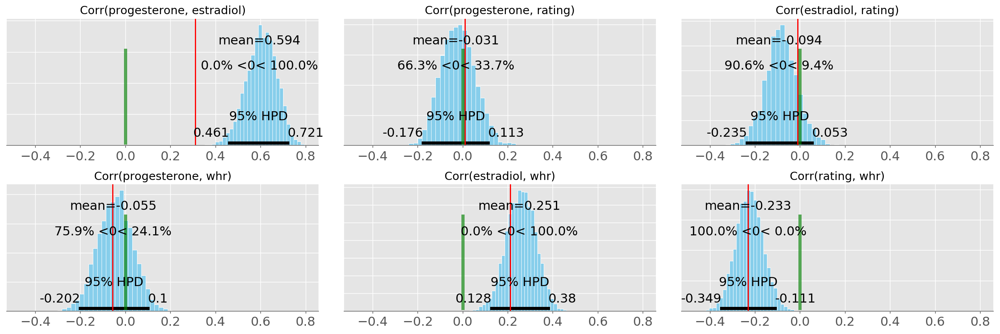

In [84]:
plotpost = pm.plots.artists.plot_posterior_op
idxall = np.tril_indices(4, k=-1)
_,  ax = plt.subplots(2, 3, figsize=(18, 6), sharex=True)
ax1 = ax.flatten()
for i in range(len(idxall[0])):
    iy, ix = idxall[0][i], idxall[1][i]
    trace_values = trace2['corr'][:, ix, iy]
    plotpost(trace_values, ax1[i], kde_plot=False, point_estimate='mean', 
             round_to=3, alpha_level=0.05, ref_val=0., rope=None, color='#87ceeb')
    
    ax1[i].axvline(empirical_corr.values[ix, iy], color='r')
    ax1[i].set_title('Corr('+measure_label[ix]+', '+measure_label[iy]+')')
plt.tight_layout();

Ordered logistic for Rating

In [ ]:
class Ordered(pm.distributions.transforms.ElemwiseTransform):
    name = "ordered"

    def forward(self, x):
        out = tt.zeros(x.shape)
        out = tt.inc_subtensor(out[0], x[0])
        out = tt.inc_subtensor(out[1:], tt.log(x[1:] - x[:-1]))
        return out
    
    def forward_val(self, x, point=None):
        x, = pm.distributions.distribution.draw_values([x], point=point)
        return self.forward(x)

    def backward(self, y):
        out = tt.zeros(y.shape)
        out = tt.inc_subtensor(out[0], y[0])
        out = tt.inc_subtensor(out[1:], tt.exp(y[1:]))
        return tt.cumsum(out)

    def jacobian_det(self, y):
        return tt.sum(y[1:])

with pm.Model() as mvmodel3:
    # on the assumption that attractiveness, progesterone and estradiol 
    # are correlated, this correlation could be capture with a cov matrix
    sd_dist = pm.HalfCauchy.dist(5)
    packed_chol = pm.LKJCholeskyCov('chol_cov', n=Nmeasure, eta=1, sd_dist=sd_dist)
    # compute the covariance matrix
    chol = pm.expand_packed_triangular(Nmeasure, packed_chol, lower=True)
    cov = tt.dot(chol, chol.T)
    
    # Extract the correlation deviations etc
    sd = tt.sqrt(tt.diag(cov))
    corr = pm.Deterministic('corr', tt.diag(sd**-1).dot(cov.dot(tt.diag(sd**-1))))
    
    # latent (zero mean Multivariate Normal)
    # latent = pm.MvNormal('latent', mu=np.zeros((Nmeasure,)), chol=chol, 
    #                      shape=dataval.shape, testval=dataval)
    
    # transform an uncorrelated normal:
    mu0 = pm.Normal('mu0', mu=0., sd=1., 
                    shape=dataval.shape)
    latent = tt.dot(chol, mu0.T).T
    
    # whr
    whr_mu = pm.Normal('whr_mu', mu=whr.mean(), sd=1.)
    whr_obs = pm.Normal('whr_obs', mu=whr_mu+latent[whr_ID, 3], sd=.01, observed=whr)
    
    # progesterone and estradiol
    hm1_mu = pm.Normal('mu1', mu=np.log(progest_mat.mean()), sd=10.)
    hm1_std = pm.HalfNormal('sd1', 1., shape=np.unique(subjID).shape, testval=hm1_emp_std)
    hm1_obs = pm.Lognormal('progest_obs', 
                          mu=tt.exp(latent[horm_ID, 0] + hm1_mu),
                          sd=hm1_std[horm_ID],
                          observed=progest_mat)
    
    hm2_mu = pm.Normal('mu2', mu=np.log(estradi_mat.mean()), sd=1.)
    hm2_std = pm.HalfNormal('sd2', .5, shape=np.unique(subjID).shape, testval=hm2_emp_std)
    hm2_obs = pm.Lognormal('estradi_obs', 
                          mu=tt.exp(latent[horm_ID, 1] + hm2_mu),
                          sd=hm2_std[horm_ID],
                          observed=estradi_mat)
    
    # ratings
    ratermu = pm.Normal('ratermu', mu=0., sd=1., shape=np.unique(raterID).shape)
    ratersd = pm.HalfNormal('ratersd', sd=10., shape=np.unique(raterID).shape)
    latentrate = latent[subjID, 2] + ratermu[raterID]*ratersd[raterID]
    # latent rating
    a = pm.Normal('a', 0., 10., 
                  transform=Ordered(), 
                  shape=Nrating, 
                  testval=np.arange(Nrating) - Nrating/2)
    pa = pm.math.sigmoid(tt.shape_padleft(a) - tt.shape_padright(latentrate))
    p_cum = tt.concatenate([
                            tt.zeros_like(tt.shape_padright(pa[:, 0])),
                            pa,
                            tt.ones_like(tt.shape_padright(pa[:, 0]))
                            ], axis=1)
    p = p_cum[:, 1:] - p_cum[:, :-1]
    rating_obs = pm.Categorical('rating_obs', p, observed=rating-1)